In [2]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from chromadb.utils.embedding_functions import OpenCLIPEmbeddingFunction

In [3]:
embedding_function = OpenCLIPEmbeddingFunction()


def get_single_image_embedding(image):
    embedding = embedding_function._encode_image(image=image)
    return np.array(embedding)

c:\Users\predator\anaconda3\envs\image-retrieval\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\predator\anaconda3\envs\image-retrieval\lib\site-packages\huggingface_hub\file_download.py:159: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\predator\.cache\huggingface\hub\models--laion--CLIP-ViT-B-32-laion2B-s34B-b79K. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python a

# Truy vấn embedding vector với độ đo L1

In [6]:
ROOT = "data"
CLASS_NAME = sorted(list(os.listdir(f"{ROOT}/train")))

In [7]:
def read_image_from_path(path, size):
    im = Image.open(path).convert("RGB").resize(size)
    return np.array(im)


def folder_to_images(folder, size):
    list_dir = [folder + "/" + name for name in os.listdir(folder)]
    images_np = np.zeros(shape=(len(list_dir), *size, 3))
    images_path = []
    for i, path in enumerate(list_dir):
        images_np[i] = read_image_from_path(path, size)
        images_path.append(path)

    images_path = np.array(images_path)
    return images_np, images_path


def plot_results(querquery_pathy, ls_path_score, reverse):
    fig = plt.figure(figsize=(15, 9))
    fig.add_subplot(2, 3, 1)
    plt.imshow(read_image_from_path(querquery_pathy, size=(448, 448)))
    plt.title(f"Query Image: {querquery_pathy.split('/')[2]}", fontsize=16)
    plt.axis("off")
    for i, path in enumerate(
        sorted(ls_path_score, key=lambda x: x[1], reverse=reverse)[:5], 2
    ):
        fig.add_subplot(2, 3, i)
        plt.imshow(read_image_from_path(path[0], size=(448, 448)))
        plt.title(f"Top {i-1}: {path[0].split('/')[2]}", fontsize=16)
        plt.axis("off")
    plt.show()

In [4]:
def absolute_difference(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))
    return np.sum(np.abs(data - query), axis=axis_batch_size)

In [5]:
def get_l1_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(
                path, size
            )  # mang numpy nhieu anh, paths
            embedding_list = []
            for idx_img in range(images_np.shape[0]):
                embedding = get_single_image_embedding(
                    images_np[idx_img].astype(np.uint8)
                )
                embedding_list.append(embedding)
            rates = absolute_difference(query_embedding, np.stack(embedding_list))
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

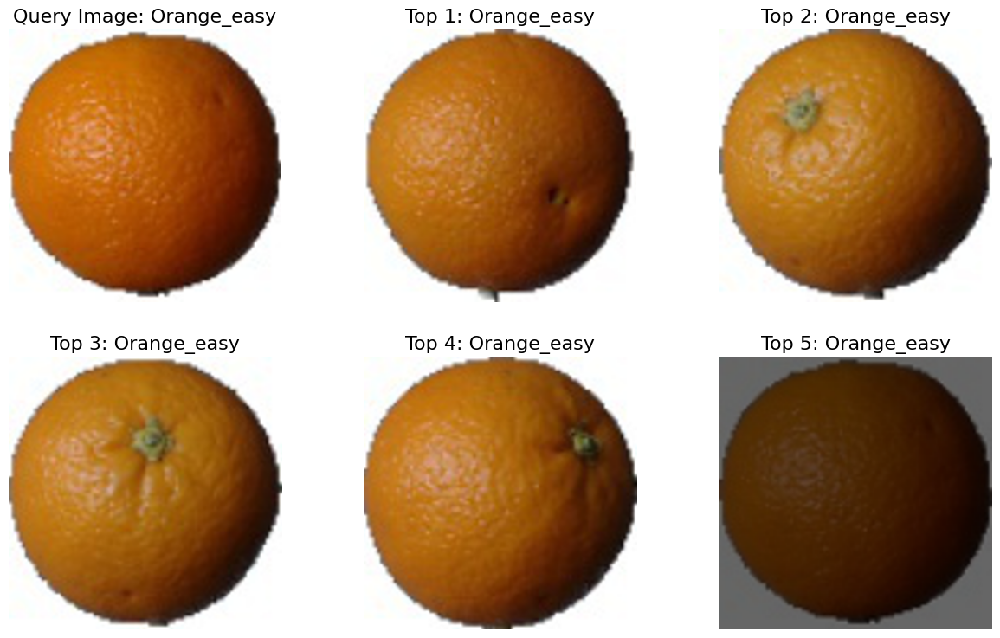

In [8]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_l1_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

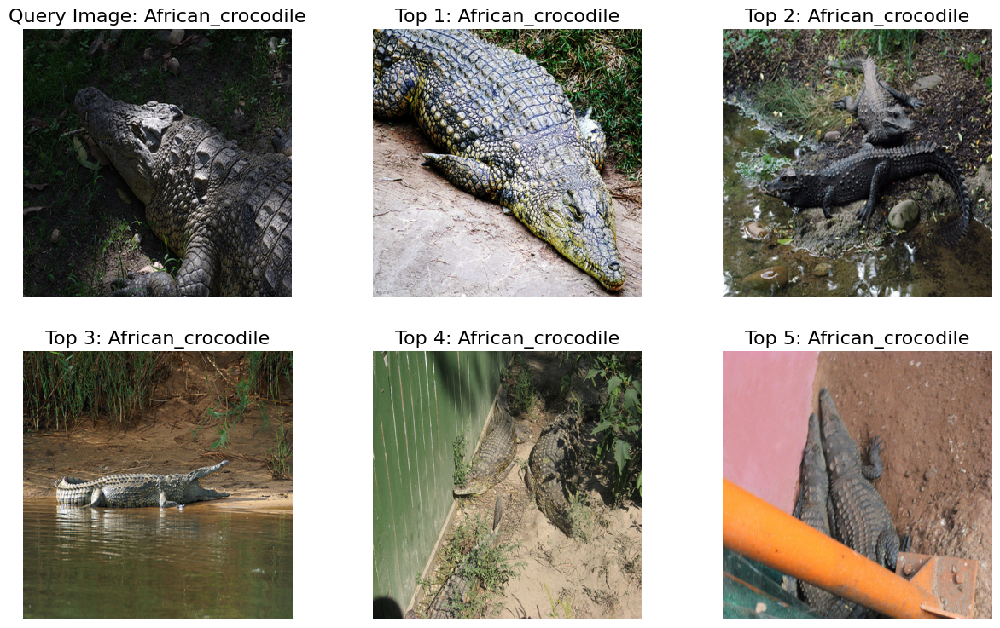

In [9]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_l1_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

In [12]:
sorted(ls_path_score, key=lambda x: x[1])[:10]

[('data/train/African_crocodile/n01697457_10393.JPEG', 9.512784707949322),
 ('data/train/African_crocodile/n01697457_5586.JPEG', 10.20219113593339),
 ('data/train/African_crocodile/n01697457_14906.JPEG', 11.992313175753054),
 ('data/train/African_crocodile/n01697457_1331.JPEG', 12.823977827421913),
 ('data/train/African_crocodile/n01697457_260.JPEG', 12.857065570889972),
 ('data/train/African_crocodile/n01697457_85.JPEG', 13.500169487480889),
 ('data/train/African_crocodile/n01697457_18587.JPEG', 14.238454491212906),
 ('data/train/African_crocodile/n01697457_8136.JPEG', 14.596848576145021),
 ('data/train/ruffed_grouse/n01797886_17360.JPEG', 14.6718063647495),
 ('data/train/vine_snake/n01739381_5304.JPEG', 15.407788950375107)]

# Truy vấn embedding vector với độ đo L2

In [13]:
def mean_square_difference(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))
    return np.mean((data - query) ** 2, axis=axis_batch_size)

In [14]:
def get_l2_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(
                path, size
            )  # mang numpy nhieu anh, paths
            embedding_list = []
            for idx_img in range(images_np.shape[0]):
                embedding = get_single_image_embedding(
                    images_np[idx_img].astype(np.uint8)
                )
                embedding_list.append(embedding)
            rates = mean_square_difference(query_embedding, np.stack(embedding_list))
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

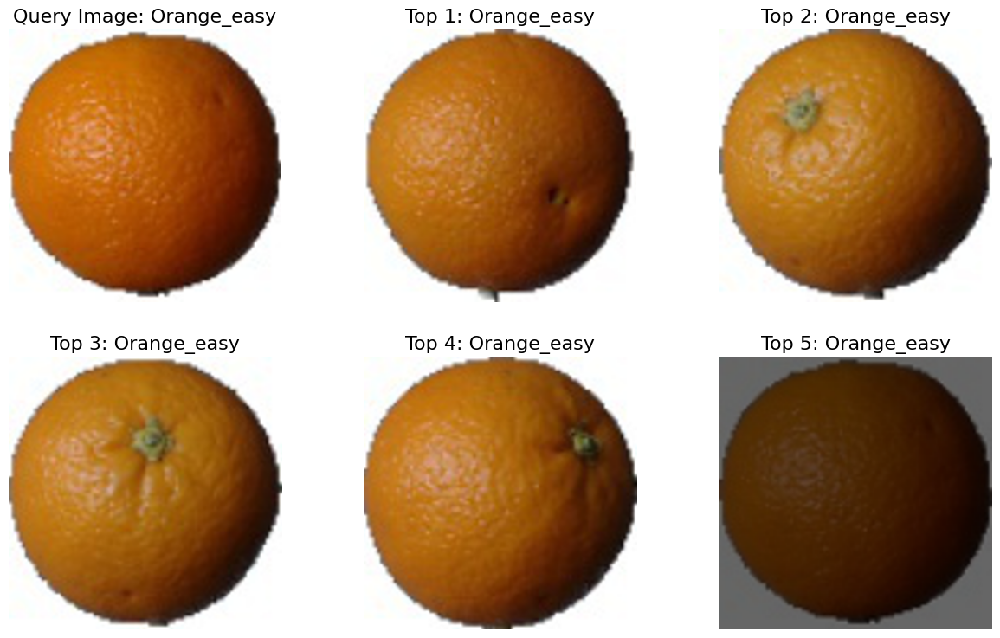

In [15]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_l2_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

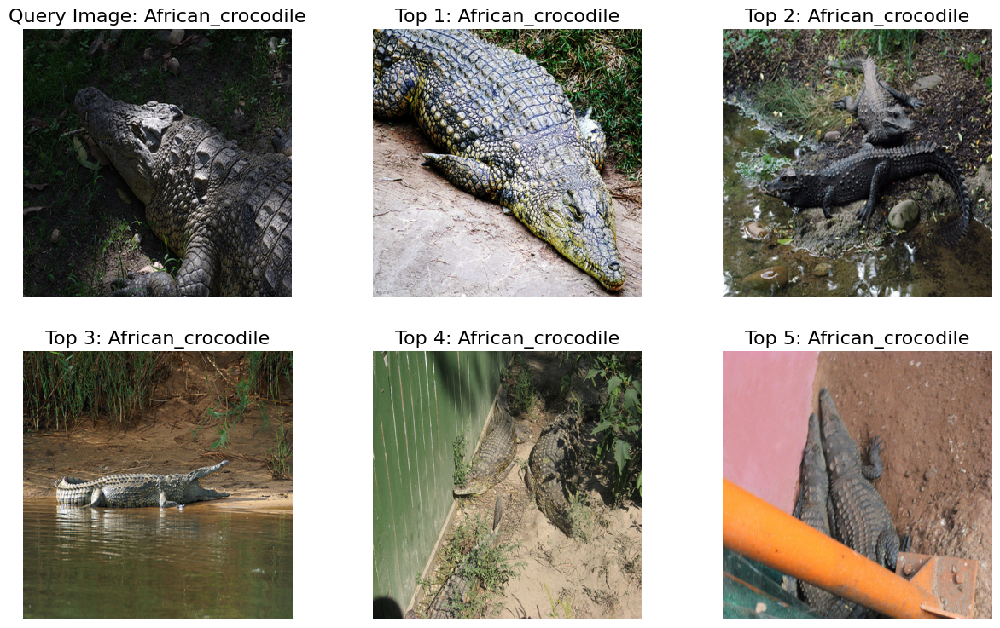

In [16]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_l2_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

In [17]:
sorted(ls_path_score, key=lambda x: x[1])[:10]

[('data/train/African_crocodile/n01697457_10393.JPEG', 0.000557418557982905),
 ('data/train/African_crocodile/n01697457_5586.JPEG', 0.0006442070748748265),
 ('data/train/African_crocodile/n01697457_14906.JPEG', 0.000873997397756679),
 ('data/train/African_crocodile/n01697457_1331.JPEG', 0.001005340338888514),
 ('data/train/African_crocodile/n01697457_260.JPEG', 0.001068585910342642),
 ('data/train/African_crocodile/n01697457_85.JPEG', 0.001187769516204865),
 ('data/train/African_crocodile/n01697457_18587.JPEG', 0.0012382036579193171),
 ('data/train/African_crocodile/n01697457_8136.JPEG', 0.0012928964570506733),
 ('data/train/ruffed_grouse/n01797886_17360.JPEG', 0.0013832849616042956),
 ('data/train/vine_snake/n01739381_5304.JPEG', 0.0015166460835819079)]

# Truy vấn embedding vector với độ đo Cosine Similarity

In [18]:
def cosine_similarity(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))
    # Ứng dụng norm
    query_norm = np.sqrt(np.sum(query**2))
    data_norm = np.sqrt(np.sum(data**2, axis=axis_batch_size))
    return np.sum(data * query, axis=axis_batch_size) / (
        query_norm * data_norm + np.finfo(float).eps
    )

In [19]:
def get_cosine_similarity_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(
                path, size
            )  # mang numpy nhieu anh, paths
            embedding_list = []
            for idx_img in range(images_np.shape[0]):
                embedding = get_single_image_embedding(
                    images_np[idx_img].astype(np.uint8)
                )
                embedding_list.append(embedding)
            rates = cosine_similarity(query_embedding, np.stack(embedding_list))
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

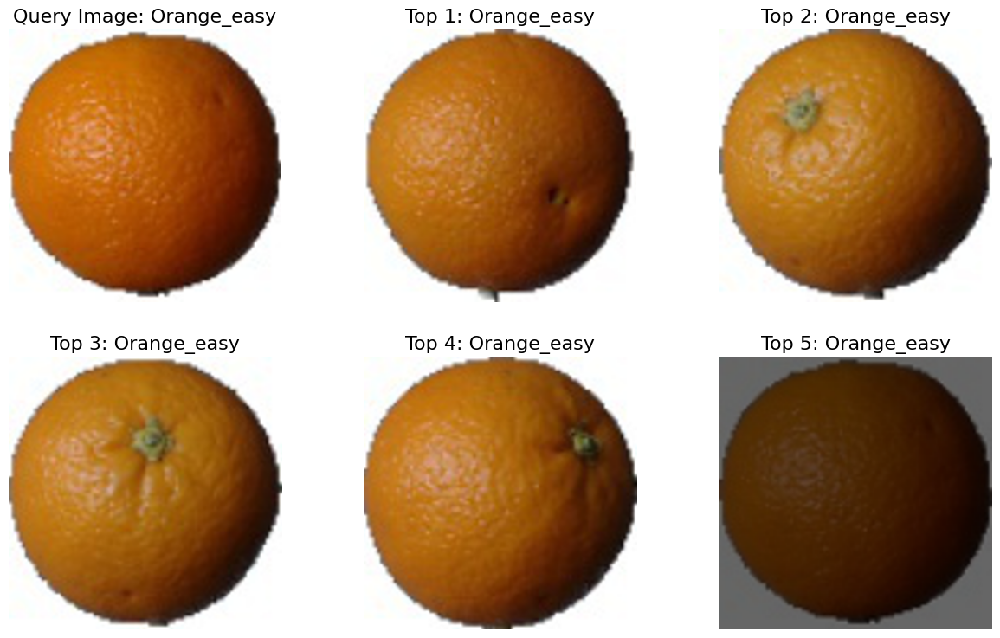

In [20]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_cosine_similarity_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

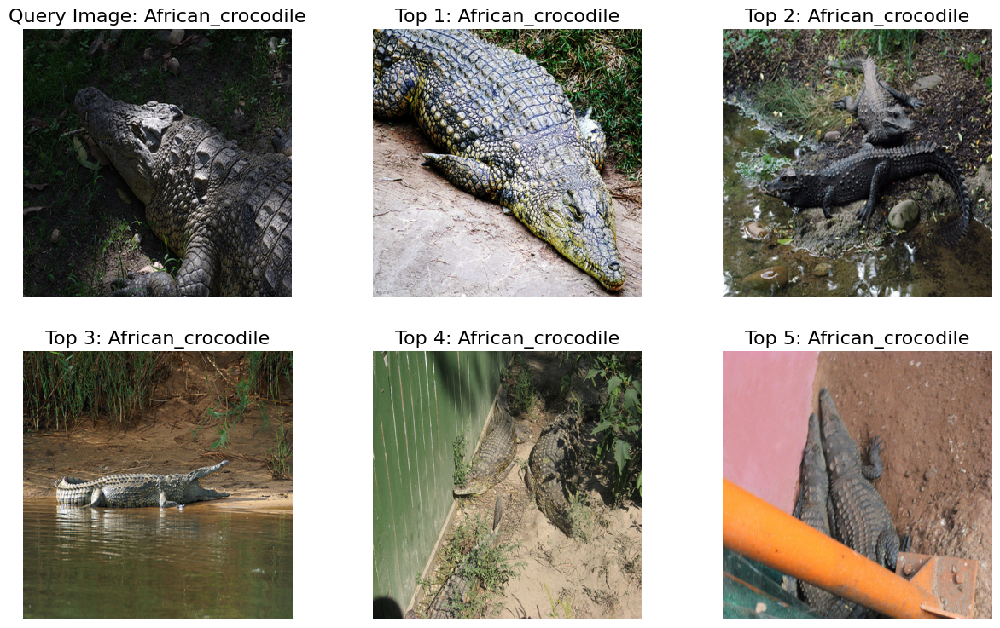

In [22]:
os.environ["CUDA_VISIBLE_DEVICES"] = "0,1"
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_cosine_similarity_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

In [23]:
sorted(ls_path_score, key=lambda x: x[1], reverse=True)[:10]

[('data/train/African_crocodile/n01697457_10393.JPEG', 0.8573008363624056),
 ('data/train/African_crocodile/n01697457_5586.JPEG', 0.8350829772682636),
 ('data/train/African_crocodile/n01697457_14906.JPEG', 0.7762566221918286),
 ('data/train/African_crocodile/n01697457_1331.JPEG', 0.7426328334327122),
 ('data/train/African_crocodile/n01697457_260.JPEG', 0.7264419903013537),
 ('data/train/African_crocodile/n01697457_85.JPEG', 0.6959309795040064),
 ('data/train/African_crocodile/n01697457_18587.JPEG', 0.6830198392426122),
 ('data/train/African_crocodile/n01697457_8136.JPEG', 0.6690185126398135),
 ('data/train/ruffed_grouse/n01797886_17360.JPEG', 0.6458789979775077),
 ('data/train/vine_snake/n01739381_5304.JPEG', 0.6117385612900016)]

# Truy vấn embedding vector với độ đo Correlation Coefficient

In [24]:
def correlation_coefficient(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))

    # Ứng dụng mean
    query_mean = query - np.mean(query)
    data_mean = data - np.mean(data, axis=axis_batch_size, keepdims=True)

    # Ứng dụng norm
    query_norm = np.sqrt(np.sum(query_mean**2))
    data_norm = np.sqrt(np.sum(data_mean**2, axis=axis_batch_size))

    return np.sum(data_mean * query_mean, axis=axis_batch_size) / (
        query_norm * data_norm + np.finfo(float).eps
    )

In [25]:
def get_correlation_coefficient_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(
                path, size
            )  # mang numpy nhieu anh, paths
            embedding_list = []
            for idx_img in range(images_np.shape[0]):
                embedding = get_single_image_embedding(
                    images_np[idx_img].astype(np.uint8)
                )
                embedding_list.append(embedding)
            rates = correlation_coefficient(query_embedding, np.stack(embedding_list))
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

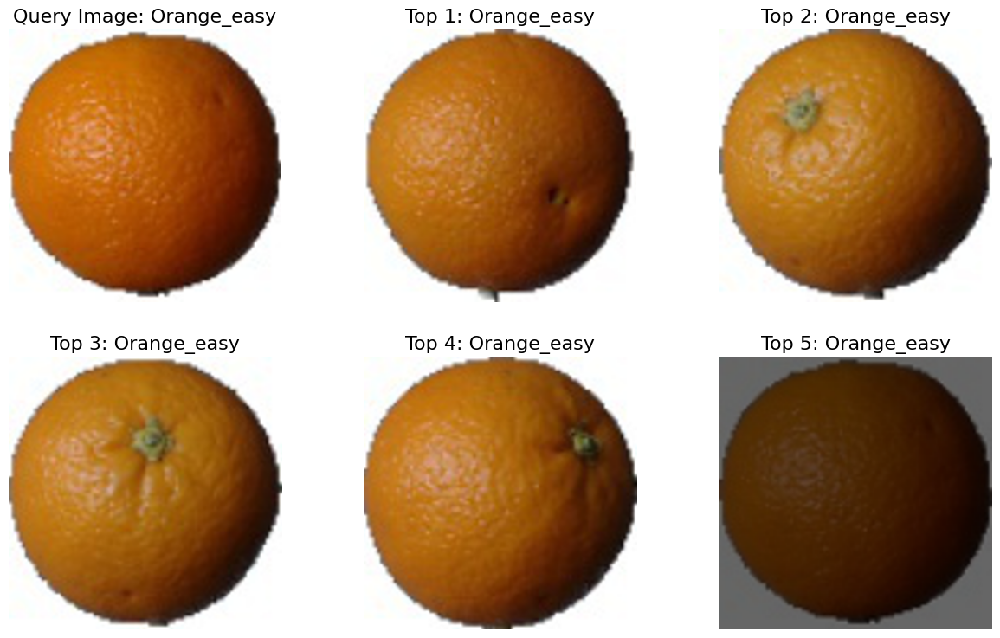

In [26]:
root_img_path = "data/train/"
query_path = "data/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score(
    root_img_path, query_path, size
)
plot_results(query_path, ls_path_score, reverse=True)

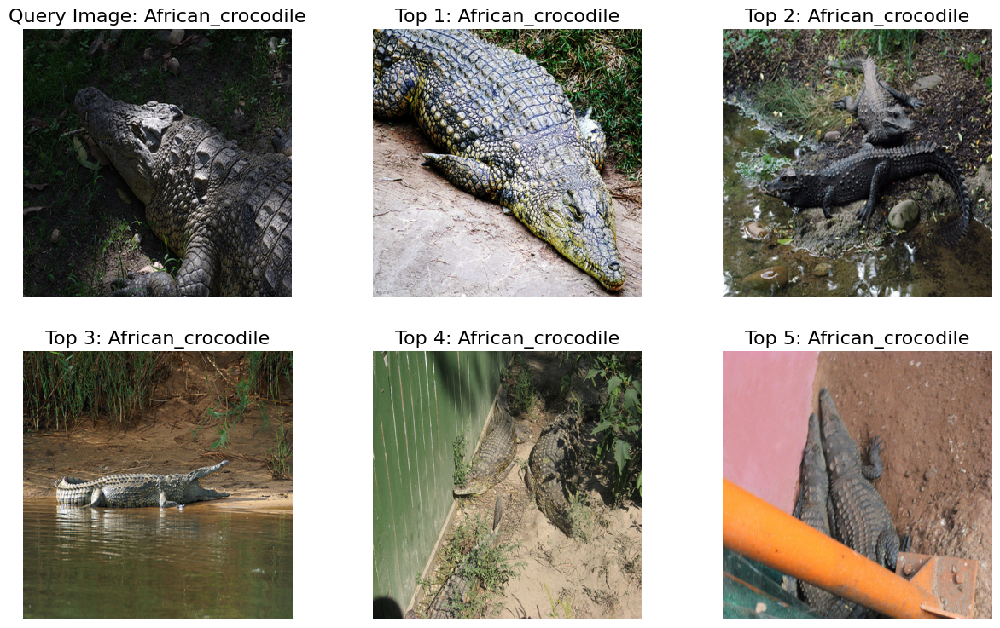

In [27]:
root_img_path = "data/train/"
query_path = "data/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score(
    root_img_path, query_path, size
)
plot_results(query_path, ls_path_score, reverse=True)

In [28]:
sorted(ls_path_score, key=lambda x: x[1], reverse=True)[:10]

[('data/train/African_crocodile/n01697457_10393.JPEG', 0.856963989196939),
 ('data/train/African_crocodile/n01697457_5586.JPEG', 0.8345371512839195),
 ('data/train/African_crocodile/n01697457_14906.JPEG', 0.7759043272440175),
 ('data/train/African_crocodile/n01697457_1331.JPEG', 0.7422240167508176),
 ('data/train/African_crocodile/n01697457_260.JPEG', 0.7255848966291064),
 ('data/train/African_crocodile/n01697457_85.JPEG', 0.6951836877069774),
 ('data/train/African_crocodile/n01697457_18587.JPEG', 0.6819440085225621),
 ('data/train/African_crocodile/n01697457_8136.JPEG', 0.6695177279570576),
 ('data/train/ruffed_grouse/n01797886_17360.JPEG', 0.6457235473138689),
 ('data/train/vine_snake/n01739381_5304.JPEG', 0.611586113687823)]